**Exploratory Data Analysis**

This is a breakdown of sales information from 3 branches of a supermarket in Myanmar over the first quarter of 2019.

The dataset can be found at: https://www.kaggle.com/aungpyaeap/supermarket-sales

In [2]:
#Importing libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import calmap
from pandas_profiling import ProfileReport

In [39]:
#Importing dataset

sales = pd.read_csv("supermarket_sales.csv")
sales1 = pd.read_csv("supermarket_sales.csv")
sales.dtypes

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3


In [4]:
#Changing the Date column to datetime data type

sales["Date"] = pd.to_datetime(sales["Date"])
sales.set_index("Date", inplace = True)
sales.describe()

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905,15.379369,6.97270
std,26.494628,2.923431,11.708825,245.885335,234.17651,0.000000,11.708825,1.71858
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905,0.508500,4.00000
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905,5.924875,5.50000
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905,12.088000,7.00000
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905,22.445250,8.50000
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905,49.650000,10.00000


C:\Users\Luke\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


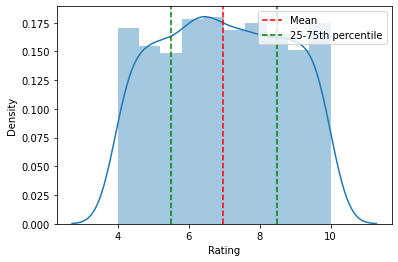

In [5]:
#Distribution of customer ratings

%matplotlib inline
sns.distplot(sales["Rating"])
plt.axvline(x = np.mean(sales["Rating"]), c = "red", ls = "--", label = "Mean")
plt.axvline(x = np.percentile(sales["Rating"], 25), c = "green", ls = "--", label = "25-75th percentile")
plt.axvline(x = np.percentile(sales["Rating"], 75), c = "green", ls = "--")
plt.legend(loc = "upper right")

array([[<AxesSubplot:title={'center':'Unit price'}>,
        <AxesSubplot:title={'center':'Quantity'}>,
        <AxesSubplot:title={'center':'Tax 5%'}>],
       [<AxesSubplot:title={'center':'Total'}>,
        <AxesSubplot:title={'center':'cogs'}>,
        <AxesSubplot:title={'center':'gross margin percentage'}>],
       [<AxesSubplot:title={'center':'gross income'}>,
        <AxesSubplot:title={'center':'Rating'}>, <AxesSubplot:>]],
      dtype=object)

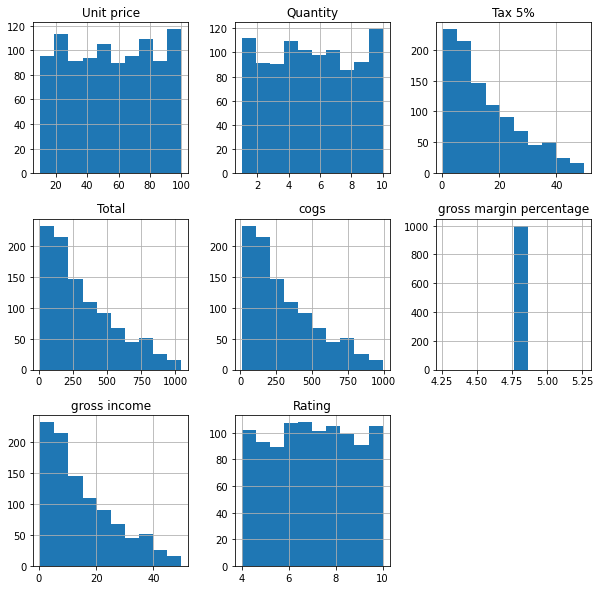

In [6]:
#Overall distributions of all numeric variables

sales.hist(figsize = (10, 10))

C:\Users\Luke\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


A    340
B    332
C    328
Name: Branch, dtype: int64

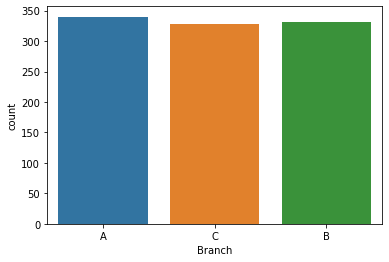

In [7]:
#Comparing number of sales between branches

sns.countplot(sales["Branch"])
sales["Branch"].value_counts()

C:\Users\Luke\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Ewallet        345
Cash           344
Credit card    311
Name: Payment, dtype: int64

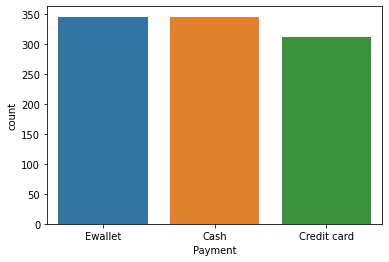

In [8]:
#Comparing the frequency of different payment methods

sns.countplot(sales["Payment"])
sales["Payment"].value_counts()

C:\Users\Luke\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Rating', ylabel='gross income'>

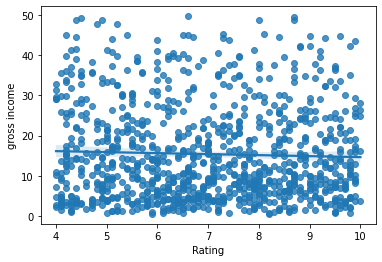

In [9]:
#Checking for a relationship between gross income and customer rating

sns.regplot(sales["Rating"], sales["gross income"])

<AxesSubplot:xlabel='Branch', ylabel='gross income'>

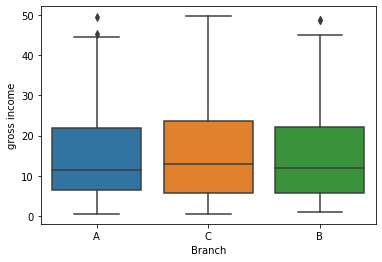

In [10]:
#Checking for a relationship between branch and gross income

sns.boxplot(x = sales["Branch"], y = sales["gross income"])

<AxesSubplot:xlabel='Gender', ylabel='gross income'>

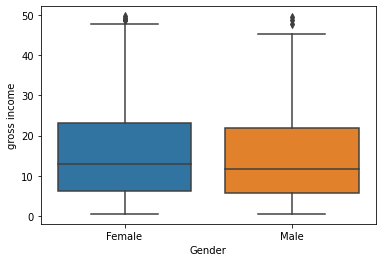

In [11]:
#Checking for a relationship between gender and gross income

sns.boxplot(x = sales["Gender"], y = sales["gross income"])

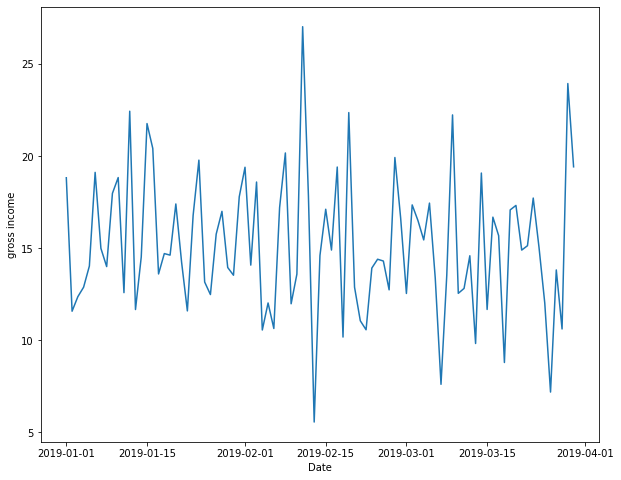

In [15]:
#Checking for a time trend in gross income

plt.figure(figsize = (10, 8))
ax = sns.lineplot(x = sales.groupby(sales.index).mean().index, y = sales.groupby(sales.index).mean()["gross income"])
plt.show()

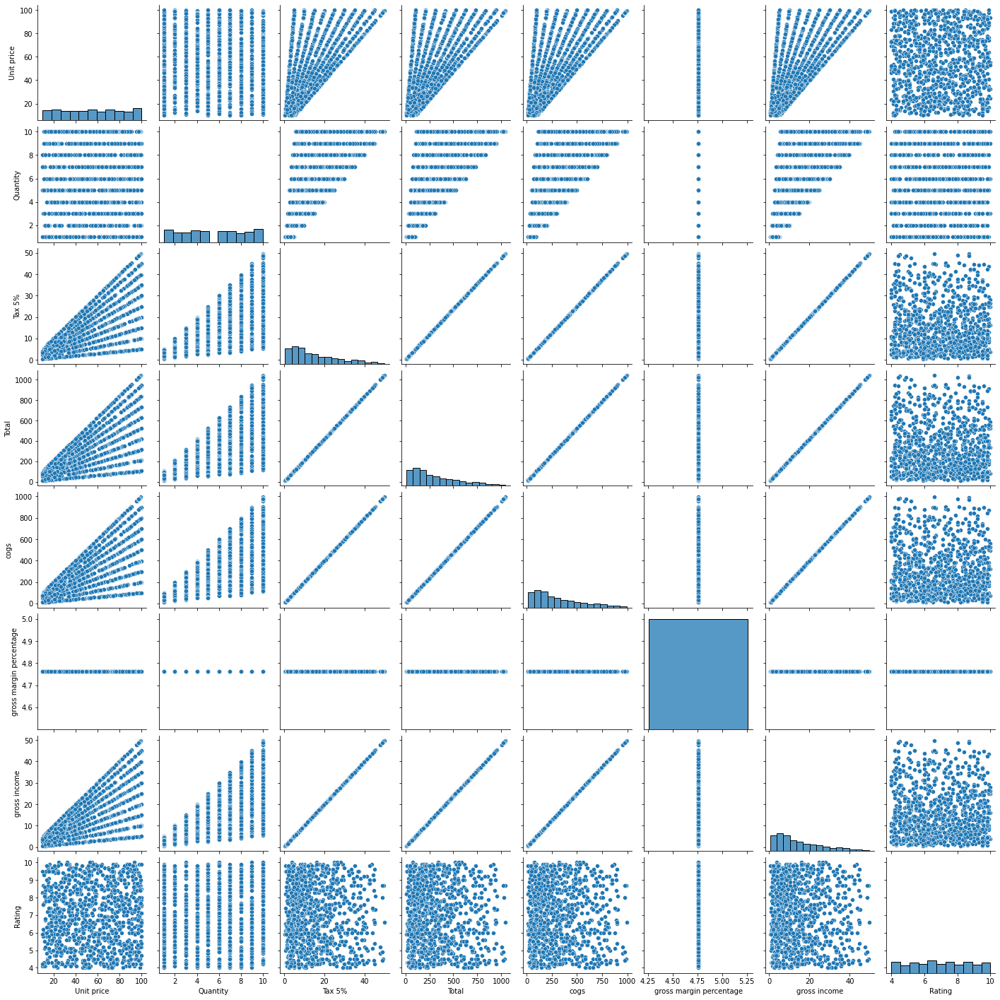

In [18]:
#Visualizing relationships between all variables

sns.pairplot(sales1)

In [33]:
#Checking for duplicate observations

sales.duplicated().sum()

0

In [32]:
#Checking for missing observations

sales.isna().sum()

Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     0
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Date                       0
Time                       0
Payment                    0
cogs                       0
gross margin percentage    0
gross income               0
Rating                     0
dtype: int64

In [29]:
#Overview of data

prof = ProfileReport(sales1)
prof

Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.68s/it]


In [35]:
#Creating a correlation matrix

np.round(sales.corr(), 2)

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
Unit price,1.00,0.01,0.63,0.63,0.63,NaN,0.63,-0.01
Quantity,0.01,1.00,0.71,0.71,0.71,NaN,0.71,-0.02
Tax 5%,0.63,0.71,1.00,1.00,1.00,NaN,1.00,-0.04
Total,0.63,0.71,1.00,1.00,1.00,NaN,1.00,-0.04
cogs,0.63,0.71,1.00,1.00,1.00,NaN,1.00,-0.04
gross margin percentage,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gross income,0.63,0.71,1.00,1.00,1.00,NaN,1.00,-0.04
Rating,-0.01,-0.02,-0.04,-0.04,-0.04,NaN,-0.04,1.00


<AxesSubplot:>

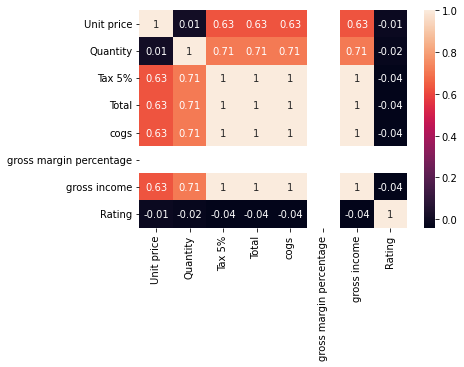

In [38]:
#Visualizing the correlation matrix using a heatmap

sns.heatmap(np.round(sales.corr(), 2), annot = True)